# I’m Something of a Painter Myself

We recognize the works of artists through their unique style, such as color choices or brush strokes. The “je ne sais quoi” of artists like Claude Monet can now be imitated with algorithms thanks to generative adversarial networks (GANs).

Computer vision has advanced tremendously in recent years and GANs are now capable of mimicking objects in a very convincing way. But creating museum-worthy masterpieces is thought of to be, well, more art than science. So can (data) science, in the form of GANs, trick classifiers into believing you’ve created a true Monet?

## Problem

A GAN consists of at least two neural networks: a generator model and a discriminator model. The generator is a neural network that creates the images. For our competition, you should generate images in the style of Monet. This generator is trained using a discriminator.

The two models will work against each other, with the generator trying to trick the discriminator, and the discriminator trying to accurately classify the real vs. generated images.

The task is to build a GAN that generates 7,000 to 10,000 Monet-style images.

In [43]:
import cv2
import os 
import torch.nn as nn
import torch
from torch.utils.data import DataLoader, Dataset
import random
from PIL import Image
import torch.nn.functional as F
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

## Data

The dataset contains four directories: monet_tfrec, photo_tfrec, monet_jpg, and photo_jpg. The monet_tfrec and monet_jpg directories contain the same painting images, and the photo_tfrec and photo_jpg directories contain the same photos.

The monet directories contain Monet paintings. These images are going to be used to train my model.

The photo directories contain photos. I will add Monet-style to these images to test my model.

To explain the datasets more specifically:

* monet_jpg - 300 Monet paintings sized 256x256 in JPEG format
* monet_tfrec - 300 Monet paintings sized 256x256 in TFRecord format
* photo_jpg - 7028 photos sized 256x256 in JPEG format
* photo_tfrec - 7028 photos sized 256x256 in TFRecord format

In [24]:
class MonetDataset(Dataset):
    def __init__(self, root, transforms=None):
        self.root_path = root
        self.photo_paths = os.listdir(os.path.join('kaggleData/photo_jpg'))
        self.monet_paths = os.listdir(os.path.join('kaggleData/monet_jpg'))
        self.transform = transforms

    def __len__(self):
        return len(self.monet_paths)

    def __getitem__(self, idx):
        photoPath = os.path.join('kaggleData/photo_jpg', self.photo_paths[idx])
        monetPath = os.path.join('kaggleData/monet_jpg', self.monet_paths[idx])
        
        if self.transform:
            photo = self.transform(self.read_img(photoPath))
            monet = self.transform(self.read_img(monetPath))

        else:
            photo = self.read_img(photoPath)
            monet = self.read_img(monetPath)

        return photo, monet

    def to_tensor(self, img):
        return torch.tensor(img, dtype=torch.float32).permute(2, 0, 1)
    
    def read_img(self, path):
        return cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)

In [25]:
sample = MonetDataset('/kaggle/input/gan-getting-started')
print(len(sample))
photo, monet = sample[0]

300


In [26]:
print(photo.shape)

(256, 256, 3)


## Exploratory Data Analysis (EDA) — Inspect, Visualize and Clean the Data

I don't think there was much necessity to clean any of the data. It was just images after all that were all the same size

I was able to verify that size and then compare a regular photo with a Monet to help understand the differences between the two before I begin to build a model that adds dimensions to the regular photos to resemble the artist's work. 

<Figure size 720x360 with 0 Axes>

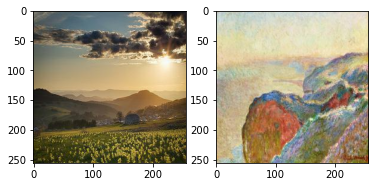

In [27]:
plt.figure(figsize=(10, 5))
fig, ax = plt.subplots(1, 2)
ax[0].imshow(photo)
ax[1].imshow(monet)
plt.show()

In [29]:
def weight_init(m):
    if any(isinstance(m, _m) for _m in [nn.Conv2d, nn.ConvTranspose2d]):
        nn.init.normal_(m.weight, mean=0.0, std=0.02)
        if m.bias is not None:
            nn.init.constant_(m.bias, 0)

In [30]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, isDropout=False):
        super().__init__()
        self._isDropout = isDropout
        
        self.padding1 = nn.ReflectionPad2d(kernel_size//2)
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size, stride=stride)
        self.bn1 = nn.InstanceNorm2d(out_channels)
        
       
        self.padding2 = nn.ReflectionPad2d(kernel_size//2)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size, stride=stride)
        self.bn2 = nn.InstanceNorm2d(out_channels)
        
        
        self.shortcut = nn.Sequential()
        if stride != 1 or in_channels != out_channels:
            
            self.shortcut = nn.Sequential(
                nn.ReflectionPad2d(kernel_size//2),
                nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(out_channels)
            )

        self.relu = nn.ReLU(inplace=True)
    
    def forward(self, x):
        identity = self.shortcut(x)
        
        out = self.padding1(x)
        out = self.conv1(out)
        out = self.bn1(out)

        out = self.relu(out)

        out = self.padding2(out)
        out = self.conv2(out)
        out = self.bn2(out)

        out += identity
        out = self.relu(out)
        
        if self._isDropout:
            out = F.dropout(out, 0.5)

        return out

In [31]:
class ResizeConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, scale_factor=2):
        super().__init__()
        self.scale_factor = scale_factor
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding=kernel_size//2)

    def forward(self, x):
        out = nn.functional.interpolate(x, scale_factor=self.scale_factor, mode='bilinear')
        out = self.conv(out)
        return out

In [32]:
class DownSample(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, isDropout=False, isNorm=True, isActivation=True):
        super().__init__()
        self._isNorm = isNorm
        self._isActiviation = isActivation
        self._isDropout = isDropout
        self.padding = nn.ReflectionPad2d(kernel_size//2)
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride)
        self.norm = nn.InstanceNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        out = self.padding(x)
        out = self.conv(out)
        if self._isNorm:
            out = self.norm(out)
        if self._isActiviation:
            out = self.relu(out)
        if self._isDropout:
            out = F.dropout(out, 0.5)
        return out

In [33]:
class UpSample(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, usingConv="Interpolate", isDropout=False, isNorm=True, isActivation=True):
        super().__init__()
        self._dropout = isDropout
        self._isNorm = isNorm
        self._isActiviation = isActivation
        if usingConv == "Interpolate":
            self.conv = ResizeConv2d(in_channels, out_channels, kernel_size, stride)
        else:
            self.conv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding=kernel_size//2, output_padding=1)
        self.norm = nn.InstanceNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        out = self.conv(x)
        if self._isNorm:
            out = self.norm(out)
        if self._dropout:
            out = F.dropout(out, 0.5)
        if self._isActiviation:
            out = self.relu(out)
        return out

In [34]:
class DoubleConv(nn.Module):
    def __init__(self, in_channel, out_channel, isDropout=False):
        super().__init__()
        self._isDropout = isDropout
        self.conv1 = nn.Conv2d(in_channel, out_channel, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(out_channel, out_channel, kernel_size=3, padding=1)
        self.relu = nn.ReLU(inplace=True)
        self.norm = nn.InstanceNorm2d(out_channel)
    
    def forward(self, x):
        x = self.conv1(x)
        x = self.norm(x)
        x = self.relu(x)
        
        x = self.conv2(x)
        x = self.norm(x)
        x = self.relu(x)
        
        return x

In [35]:
class DownBlock(nn.Module):
    def __init__(self, in_channel, out_channel, isDropout=False):
        super().__init__()
        self._isDropout = isDropout
        self.conv = DoubleConv(in_channel, out_channel)
        self.pooling = nn.MaxPool2d(kernel_size=2, stride=2)
    
    def forward(self, x):
        skip_out = self.conv(x)
        down_out = self.pooling(skip_out)
        
        if self._isDropout:
            down_out = F.dropout(down_out, 0.5)
            skip_out = F.dropout(skip_out, 0.5)
            
        return (down_out, skip_out)

In [36]:
class UpBlock(nn.Module):
    def __init__(self, in_channel, out_channel, isDropout=False):
        super().__init__()
        self._isDropout = isDropout
        self.conv1 = nn.ConvTranspose2d(in_channel-out_channel, in_channel-out_channel, kernel_size=2, stride=2)
        self.conv2 = DoubleConv(in_channel, out_channel)
    
    def forward(self, down_input, skip_input):
        x = self.conv1(down_input)
        x = torch.cat([x, skip_input], dim=1)
        
        x = self.conv2(x)

        if self._isDropout:
            x = F.dropout(x, 0.5)
            
        return x

In [37]:
class Generator_ResNet(nn.Module):
    def __init__(self, residual_blocks=9):
        super().__init__()
        
        self.network = []
        #c7s1-64
        self.network.append(DownSample(in_channels=3, out_channels=64, kernel_size=7, stride=1))
        #d128
        self.network.append(DownSample(in_channels=64, out_channels=128, kernel_size=3, stride=2))
        #d256
        self.network.append(DownSample(in_channels=128, out_channels=256, kernel_size=3, stride=2))
        #residual blocks
        for _ in range(residual_blocks):
            self.network.append(ResidualBlock(256, 256))
        #u128
        self.network.append(UpSample(in_channels=256, out_channels=128, kernel_size=3, stride=1, usingConv="Interpolate", isDropout=True))
        #u64
        self.network.append(UpSample(in_channels=128, out_channels=64, kernel_size=3, stride=1, usingConv="Interpolate", isDropout=True))
        #c7s1-3
        self.network.append(DownSample(in_channels=64, out_channels=3, kernel_size=7, stride=1, isActivation=False))
        self.network.append(nn.Tanh())

        self.model = nn.Sequential(*self.network)
        self.apply(weight_init)
        
    def forward(self, x):
        return self.model(x)

In [38]:
class Generator_UNet(nn.Module):
    def __init__(self, _in_channel=3, _out_channel=3):
        super().__init__()
        
        self.network = []
        
        #Down
        self.downBlock1 = DownBlock(in_channel=_in_channel, out_channel=64)
        self.downBlock2 = DownBlock(in_channel=64, out_channel=128)
        self.downBlock3 = DownBlock(in_channel=128, out_channel=256)
        self.downBlock4 = DownBlock(in_channel=256, out_channel=512)
        
        #BottleNeck
        self.bottleneck = DoubleConv(512, 1024)
        
        #Up
        self.upBlock1 = UpBlock(in_channel=1024+512, out_channel=512, isDropout=True)
        self.upBlock2 = UpBlock(in_channel=512+256, out_channel=256, isDropout=True)
        self.upBlock3 = UpBlock(in_channel=256+128, out_channel=128, isDropout=True)
        self.upBlock4 = UpBlock(in_channel=128+64, out_channel=64)
                
        #Final
        self.finalConv = nn.Conv2d(64, _out_channel, kernel_size=1)
                
    def forward(self, x):
        x, skip_out_1 = self.downBlock1(x)
        x, skip_out_2 = self.downBlock2(x)
        x, skip_out_3 = self.downBlock3(x)
        x, skip_out_4 = self.downBlock4(x)
        
        x = self.bottleneck(x)
        
        x = self.upBlock1(x, skip_out_4)
        x = self.upBlock2(x, skip_out_3)
        x = self.upBlock3(x, skip_out_2)
        x = self.upBlock4(x, skip_out_1)
        
        out = self.finalConv(x)
        return out

In [39]:
gen = Generator_UNet()

In [40]:
gen = Generator_ResNet()

In [41]:
print(photo.shape)
test = gen(sample.to_tensor(photo).unsqueeze(0))
print(test.shape)

(256, 256, 3)
torch.Size([1, 3, 256, 256])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 720x360 with 0 Axes>

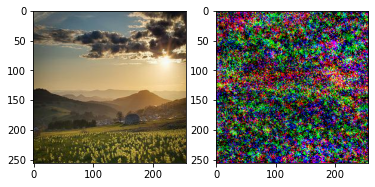

In [44]:
plt.figure(figsize=(10, 5))
fig, ax = plt.subplots(1, 2)
ax[0].imshow(photo)
ax[1].imshow(test.detach().numpy().squeeze().transpose(1, 2, 0))
plt.show()

## Model Architecture

The goal is to create a Generator and a Discriminator. The Generators purpose is to add a lot of static and colors so that there are more layers than the natural picture has. Using a U-Net allows for image segmentation so that there I can reconstruct the spatial information.

After ensuring that the model is successful in this stage, I work on building a discriminator so that the image actually looks like a Monet. The goal is to tune the hyperparamters until I find a model that works the best. And boy did this take forever to run. Like over a day. I can't be bothered to change anything and even typing this feels exhausting because I just want to submit it.

In [45]:
def unnormalize(img, mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]):
    for t, m, s in zip(img, mean, std):
        t.mul_(s).add_(s)
        
    return img

In [46]:
class DownSample_Dis(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, isNorm=True):
        super().__init__()
        self._isNorm = isNorm
        
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding=kernel_size//2)
        self.norm = nn.InstanceNorm2d(out_channels)
        self.relu = nn.LeakyReLU(negative_slope=0.2)
        self.apply(weight_init)
        
    def forward(self, x):
        out = self.conv(x)
        if self._isNorm:
            out = self.norm(out)
        out = self.relu(out)
        return out

In [47]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()

        self.network = []
        self.network.append(DownSample_Dis(in_channels=3, out_channels=64, kernel_size=4, stride=2, isNorm=False))
        self.network.append(DownSample_Dis(in_channels=64, out_channels=128, kernel_size=4, stride=2))
        self.network.append(DownSample_Dis(in_channels=128, out_channels=256, kernel_size=4, stride=2))
        self.network.append(DownSample_Dis(in_channels=256, out_channels=512, kernel_size=4, stride=2))
        self.network.append(nn.Conv2d(in_channels=512, out_channels=1, kernel_size=4, stride=1))
        
        self.model = nn.Sequential(*self.network)
        self.apply(weight_init)

    def forward(self, x):
        x = self.model(x)
        x = nn.Dropout(0.5)(x)
        return F.avg_pool2d(x, x.size()[2:]).view(x.size()[0], -1)

In [48]:
dis = Discriminator()

In [49]:
t = dis(test)
print(t)

tensor([[-0.1839]], grad_fn=<ViewBackward0>)


In [50]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
lambda_cycle = 10
lambda_identity = 5
num_epochs = 20
decay_epochs = 20
buffer_size = 50
learning_rate = 2e-4
# Model
gen_type = "UNet"
using_data_aug = True
using_LSGAN = False
using_identity_loss = False

In [51]:
if gen_type == "ResNet":
    gen_AB = Generator_ResNet()
    gen_BA = Generator_ResNet()
else:
    gen_AB = Generator_UNet()
    gen_AB.apply(weight_init)
    gen_BA = Generator_UNet()
    gen_BA.apply(weight_init)

dis_A = Discriminator()
dis_B = Discriminator()

gen_AB.to(device)
gen_BA.to(device)
dis_A.to(device)
dis_B.to(device)

Discriminator(
  (model): Sequential(
    (0): DownSample_Dis(
      (conv): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
      (norm): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (relu): LeakyReLU(negative_slope=0.2)
    )
    (1): DownSample_Dis(
      (conv): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
      (norm): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (relu): LeakyReLU(negative_slope=0.2)
    )
    (2): DownSample_Dis(
      (conv): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
      (norm): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (relu): LeakyReLU(negative_slope=0.2)
    )
    (3): DownSample_Dis(
      (conv): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(2, 2))
      (norm): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=False, track_running_st

In [52]:
# loss function
criterion_GAN = nn.MSELoss()
criterion_cycle = nn.L1Loss()
criterion_identity = nn.L1Loss()

In [53]:
from torchvision import transforms

transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

transform_Augmentation = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((286, 286), Image.BICUBIC),
    transforms.RandomCrop((256, 256)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

In [54]:
# Dataloader
from torch.utils.data import DataLoader

if using_data_aug:
    monetDataset = MonetDataset('/kaggle/input/gan-getting-started', transform_Augmentation)
else:
    monetDataset = MonetDataset('/kaggle/input/gan-getting-started', transform)

#train_set, vaild_set = torch.utils.data.random_split(monetDataset, [len(monetDataset) - 50, 50])
#train_dataloader = DataLoader(dataset=train_set, batch_size=8, shuffle=True)
#vaild_dataloader = DataLoader(dataset=vaild_set, batch_size=1, shuffle=True)
dataloader = DataLoader(dataset=monetDataset, batch_size=1, shuffle=True, pin_memory=True)

In [55]:
from torch.optim import lr_scheduler
import itertools

# Optimizer & LR scheduler
optimizer_G = torch.optim.Adam(itertools.chain(gen_AB.parameters(), gen_BA.parameters()), lr=learning_rate, betas=(0.5, 0.999))
optimizer_D = torch.optim.Adam(itertools.chain(dis_A.parameters(), dis_B.parameters()), lr=learning_rate, betas=(0.5, 0.999))

LambdaLR = lambda epoch: 1 - max(0, epoch - decay_epochs + 1) / (num_epochs - decay_epochs + 1)
scheduler_G = lr_scheduler.LambdaLR(optimizer_G, lr_lambda=LambdaLR)
scheduler_D = lr_scheduler.LambdaLR(optimizer_D, lr_lambda=LambdaLR)

In [56]:
class ImageBuffer():
    def __init__(self):
        self.buffer = []
        self.max_size = 50
    
    def push_and_pop(self, datas):
        return_imgs = []
        for element in datas.data:
            element = torch.unsqueeze(element, 0)
            if len(self.buffer) < self.max_size:
                self.buffer.append(element)
                return_imgs.append(element)
            else:
                if random.uniform(0, 1) > 0.5:
                    i = random.randint(0, self.max_size - 1)
                    return_imgs.append(self.buffer[i].clone())
                    self.buffer[i] = element
                else:
                    return_imgs.append(element)
                    
        return torch.cat(return_imgs, 0)

In [57]:
def plot_image(amount):
    _, ax = plt.subplots(amount, 2, figsize=(12, 12))

    if amount == 1:
        ax = [ax]
    
    for i in range(amount):
        photo, _ = monetDataset[i]
        photo = photo.unsqueeze(0)

        with torch.no_grad():
            monet = gen_AB(photo.to(device)).cpu().detach()

        photo = unnormalize(photo)
        monet = unnormalize(monet)

        ax[i][0].imshow(photo.squeeze().permute(1, 2, 0))
        ax[i][1].imshow(monet.squeeze().permute(1, 2, 0))
        ax[i][0].axis("off")
        ax[i][1].axis("off")
      
    plt.show()

## Results and Analysis

The final Epoch game me the results of:
Epoch: 20 | Generator Loss: 2.26104163368543 | Discriminator Loss: 0.4417468906597545
compared to the first generation of:
Epoch: 1 | Generator Loss: 3.2388192137082417 | Discriminator Loss: 0.7003519776463508

Overall the model was able to improve significantly. I was very much asleep during the time the model was compiling, but there is definitely evidence that the model was able to build and improve over the renditions. 

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch: 1 | Generator Loss: 3.2388192137082417 | Discriminator Loss: 0.7003519776463508


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


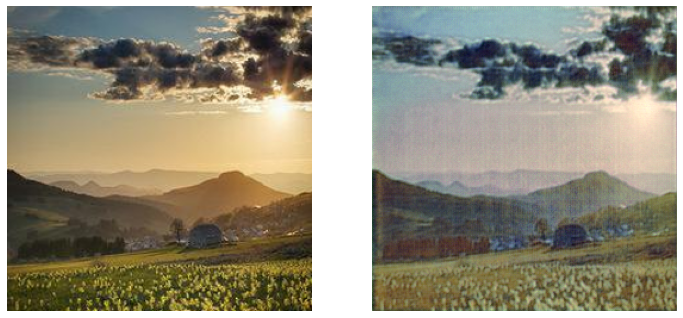

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch: 2 | Generator Loss: 2.8105521214008333 | Discriminator Loss: 0.5463815815250079


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


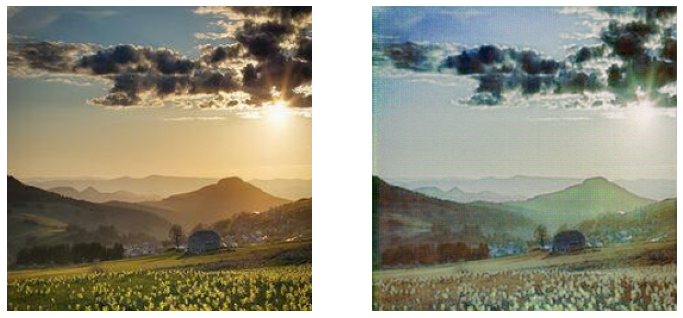

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch: 3 | Generator Loss: 2.832994653781255 | Discriminator Loss: 0.5151211555923024


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


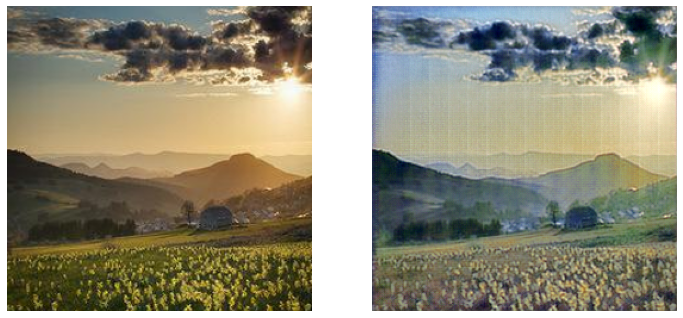

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch: 4 | Generator Loss: 2.732450674374898 | Discriminator Loss: 0.484876147856315


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


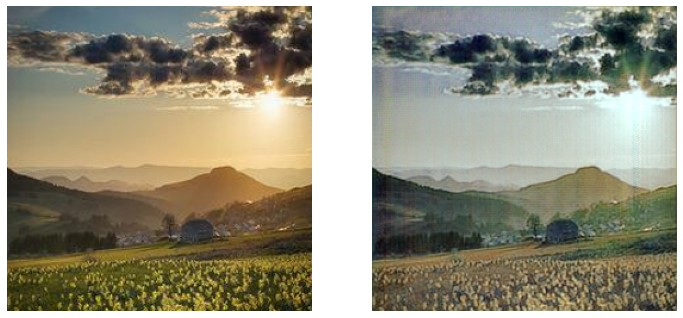

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch: 5 | Generator Loss: 2.751818656126658 | Discriminator Loss: 0.46758794169872997


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


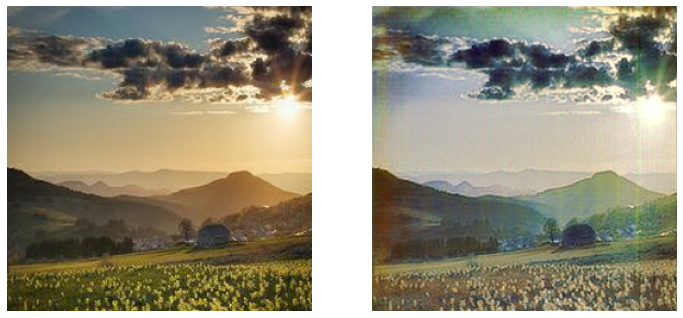

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch: 6 | Generator Loss: 2.690802229642868 | Discriminator Loss: 0.44272231083363295


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


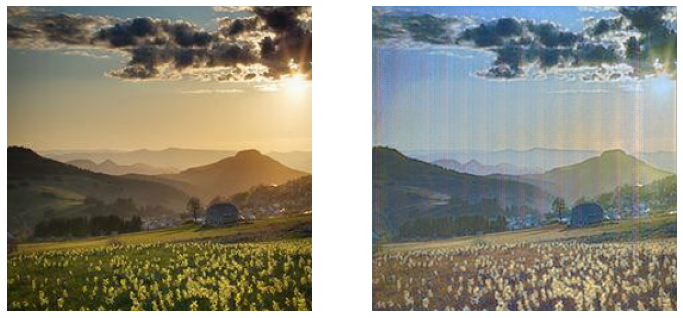

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch: 7 | Generator Loss: 2.6208790163199107 | Discriminator Loss: 0.44134084711472193


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


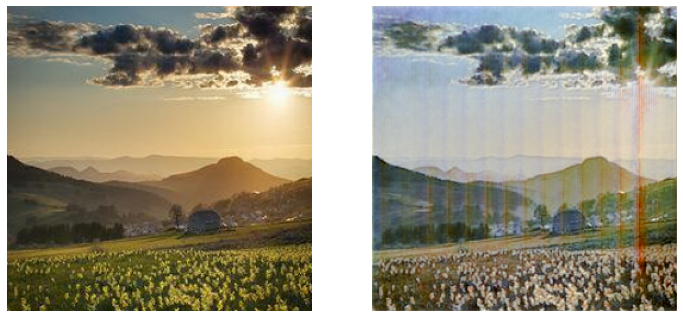

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch: 8 | Generator Loss: 2.616146163145701 | Discriminator Loss: 0.44367345340549946


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


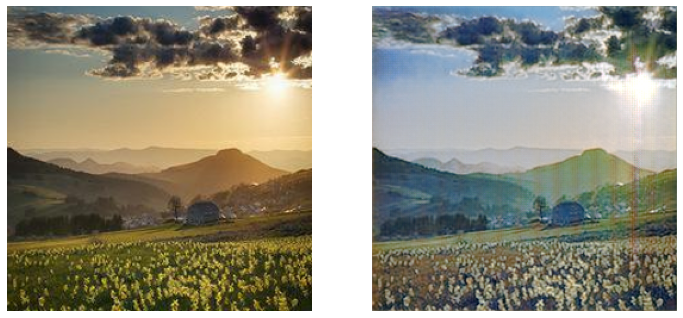

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch: 9 | Generator Loss: 2.5455645306905113 | Discriminator Loss: 0.4455598437227309


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


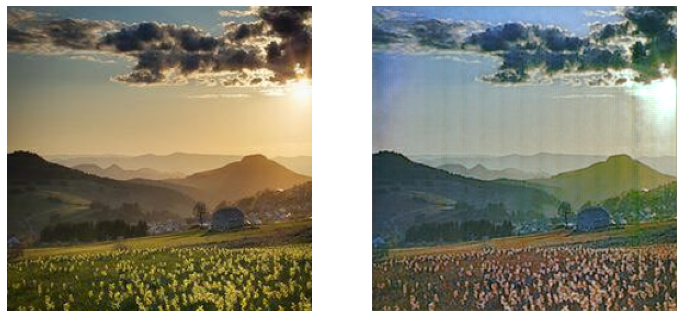

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch: 10 | Generator Loss: 2.5527390650908153 | Discriminator Loss: 0.45001514785612623


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


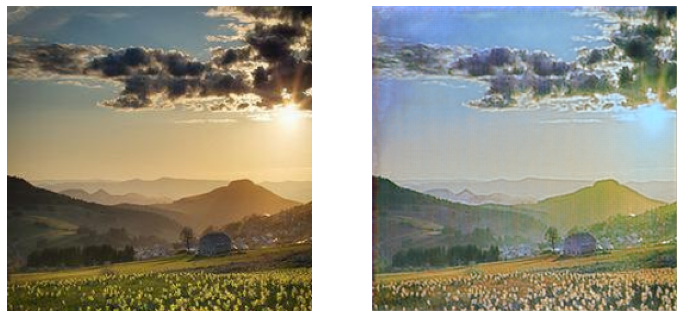

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch: 11 | Generator Loss: 2.483472703297933 | Discriminator Loss: 0.46745945752287904


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


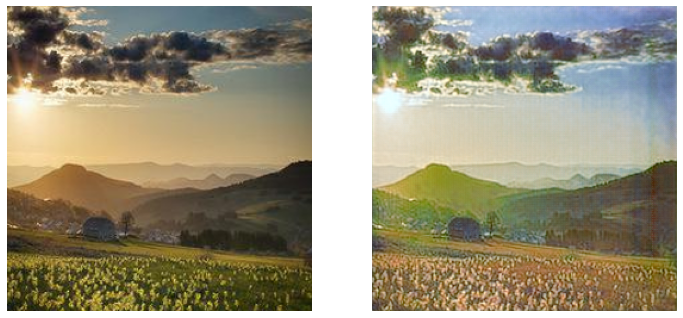

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch: 12 | Generator Loss: 2.4723363741238913 | Discriminator Loss: 0.4369647708535194


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


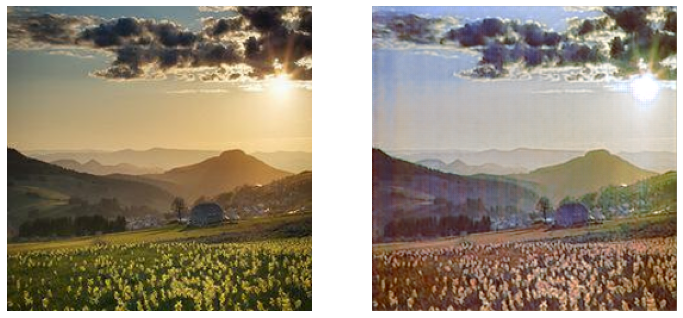

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch: 13 | Generator Loss: 2.4233208429813384 | Discriminator Loss: 0.4513522903155536


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


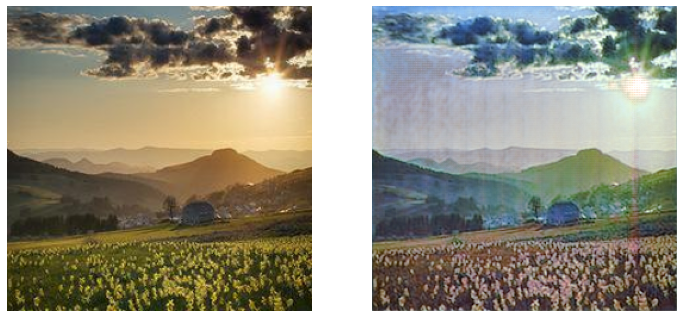

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch: 14 | Generator Loss: 2.43374832034111 | Discriminator Loss: 0.45002960129330555


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


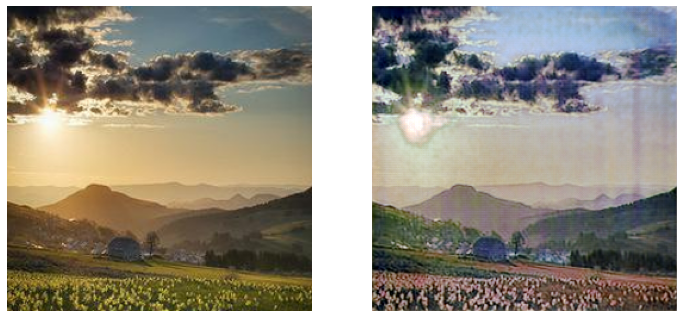

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch: 15 | Generator Loss: 2.400725210507711 | Discriminator Loss: 0.4320348165680965


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


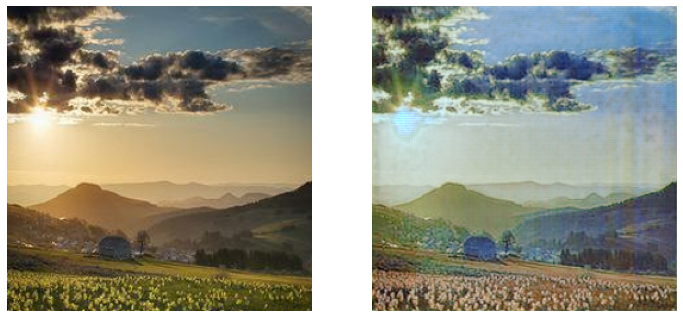

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch: 16 | Generator Loss: 2.364461914698283 | Discriminator Loss: 0.4448020281549543


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


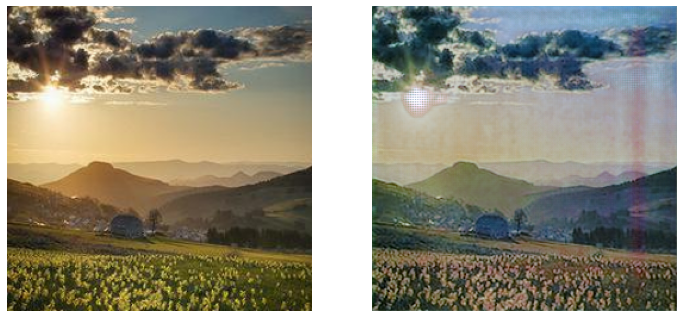

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch: 17 | Generator Loss: 2.314616506497065 | Discriminator Loss: 0.465272658765316


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


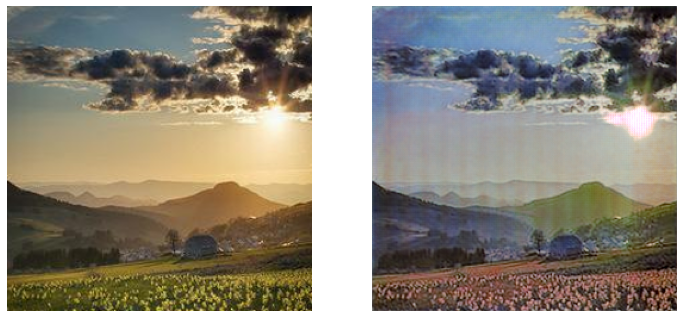

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch: 18 | Generator Loss: 2.3215378165245055 | Discriminator Loss: 0.45002534324924154


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


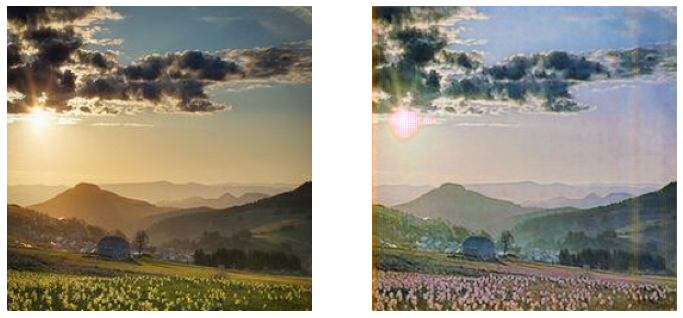

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch: 19 | Generator Loss: 2.2671987509727476 | Discriminator Loss: 0.4450150020296375


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


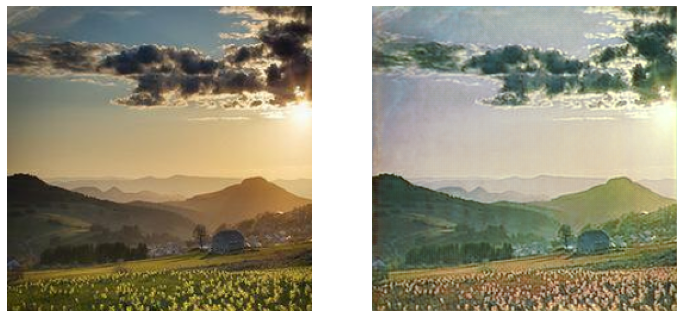

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch: 20 | Generator Loss: 2.26104163368543 | Discriminator Loss: 0.4417468906597545


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


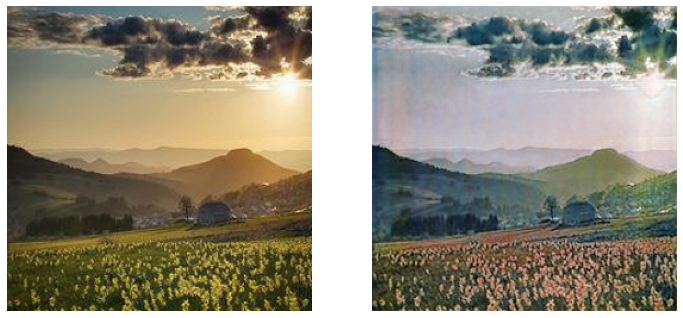

In [58]:
from collections import defaultdict
from tqdm.auto import tqdm
logger = list()

for epoch in range(1, num_epochs+1):
    loss_batch = defaultdict(float)
    x_fake_A_buffer = ImageBuffer()
    x_fake_B_buffer = ImageBuffer()
    
    total_g_loss = 0.0
    total_d_loss = 0.0
    
    for i, data in enumerate(tqdm(dataloader)):
        # Data
        x_A = data[0].to(device) #photo
        x_B = data[1].to(device) #monet

        # Generators
        gen_AB.zero_grad()
        gen_BA.zero_grad()

        # Generate
        x_fake_A = gen_BA(x_B)
        x_fake_B = gen_AB(x_A)

        # Adversarial
        x_adv_A = dis_A(x_fake_A)
        x_adv_B = dis_B(x_fake_B)

        # Cycle
        x_cycle_A = gen_BA(x_fake_B)
        x_cycle_B = gen_AB(x_fake_A)

        # Adversarial loss
        # LSGAN
        if using_LSGAN:
            x_adv_A_2 = dis_A(x_cycle_A)
            x_adv_B_2 = dis_B(x_cycle_B)

            g_loss_adv_A = criterion_GAN(x_adv_A, torch.ones_like(x_adv_A)) / 2 + torch.square(x_adv_A_2) / 2
            g_loss_adv_B = criterion_GAN(x_adv_B, torch.ones_like(x_adv_B)) / 2 + torch.square(x_adv_B_2) / 2
        # Normal
        else:
            g_loss_adv_A = criterion_GAN(x_adv_A, torch.ones_like(x_adv_A))
            g_loss_adv_B = criterion_GAN(x_adv_B, torch.ones_like(x_adv_B))

        # Cycle loss
        g_loss_cycle_A = criterion_cycle(x_cycle_A, x_A) * lambda_cycle 
        g_loss_cycle_B = criterion_cycle(x_cycle_B, x_B) * lambda_cycle

        # Identity loss
        g_loss_identity_A = criterion_identity(x_cycle_A, x_A) * lambda_identity if using_identity_loss else 0
        g_loss_identity_B = criterion_identity(x_cycle_B, x_B) * lambda_identity if using_identity_loss else 0

        g_loss_A = g_loss_adv_A + g_loss_cycle_A + g_loss_identity_A
        g_loss_B = g_loss_adv_B + g_loss_cycle_B + g_loss_identity_B
        g_loss = (g_loss_A + g_loss_B) / 2 
              
        g_loss.backward()
        total_g_loss += g_loss.item()

        optimizer_G.step()

        # Discriminators
        dis_A.zero_grad()
        dis_B.zero_grad()

        # photo
        x_fake_A = x_fake_A_buffer.push_and_pop(x_fake_A)
        d_real_A = dis_A(x_A)
        d_fake_A = dis_A(x_fake_A.detach())
        
        # monet
        x_fake_B = x_fake_B_buffer.push_and_pop(x_fake_B)
        d_real_B = dis_B(x_B)
        d_fake_B = dis_B(x_fake_B.detach())

        # Discriminator Loss
        d_loss_A = criterion_GAN(d_real_A, torch.ones_like(d_real_A)) + criterion_GAN(d_fake_A, torch.zeros_like(d_fake_A))
        d_loss_B = criterion_GAN(d_real_B, torch.ones_like(d_real_B)) + criterion_GAN(d_fake_B, torch.zeros_like(d_fake_B))

        d_loss = (d_loss_A + d_loss_B) / 2

        d_loss.backward()
        total_d_loss += d_loss.item()
        optimizer_D.step()
    
    avg_g_loss = total_g_loss / len(dataloader)
    avg_d_loss = total_d_loss / len(dataloader)
    
    logger.append({
        'g_loss': avg_g_loss,
        'd_loss': avg_d_loss
    })

    scheduler_G.step()
    scheduler_D.step()
    
    print(f"Epoch: {epoch} | Generator Loss: {avg_g_loss} | Discriminator Loss: {avg_d_loss}")
    plot_image(1)
    #torch.save(gen_AB.state_dict(), f'gen_AB_{epoch}.pth')

In [59]:
g_loss = []
d_loss = []

for log in logger:
    g_loss.append(log['g_loss'])
    d_loss.append(log['d_loss'])

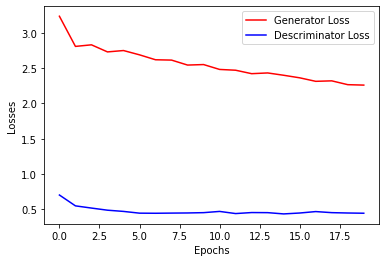

In [60]:
plt.xlabel("Epochs")
plt.ylabel("Losses")
plt.plot(g_loss, 'r', label='Generator Loss')
plt.plot(d_loss, 'b', label='Descriminator Loss')
plt.legend()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


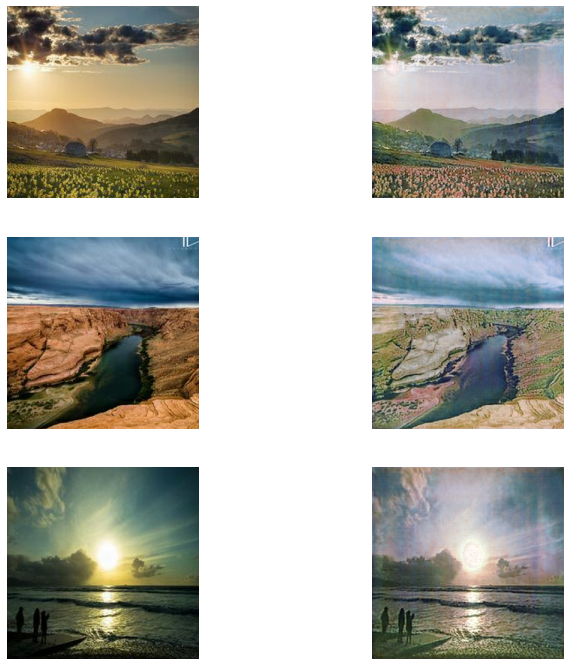

In [61]:
gen_AB.eval()
plot_image(3)

In [65]:
class PhotoDataset(Dataset):
    def __init__(self, root, transforms=None):
        self.root_path = root
        self.photo_paths = os.listdir(os.path.join('kaggleData/photo_jpg'))
        self.transform = transforms

    def __len__(self):
        return len(self.photo_paths)

    def __getitem__(self, idx):
        photoPath = os.path.join('kaggleData/photo_jpg', self.photo_paths[idx])

        if self.transform:
            photo = self.transform(self.read_img(photoPath))

        else:
            photo = self.read_img(photoPath)

        return photo

    def to_tensor(self, img):
        return torch.tensor(img, dtype=torch.float32).permute(2, 0, 1)
    
    def read_img(self, path):
        return cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)

In [66]:
fin_ds = PhotoDataset('/kaggle/input/gan-getting-started', transforms=transform)
fin_dl = DataLoader(fin_ds, batch_size=1)

In [67]:
os.makedirs('../images', exist_ok=True)

In [68]:
t = transforms.ToPILImage()

In [69]:
gen_AB.eval()

for i, photo in enumerate(tqdm(fin_dl)):
    photo = photo.to(device) #photo
    with torch.no_grad():
        pred_monet = gen_AB(photo).cpu().detach()
    pred_monet = unnormalize(pred_monet)
    img = t(pred_monet.squeeze())
    img.save(f'../images/{i+1}.jpg')

  0%|          | 0/7038 [00:00<?, ?it/s]

In [72]:
import shutil
shutil.make_archive("/kaggle/working/images", 'zip', "kaggleData/images")

'C:\\kaggle\\working\\images.zip'

## Conclusion

Overall this project was interesting. I really wanted to work on the one with Dogs, but I am glad that I took the time to actually read the assignment where it clearly said that the dataset on Kaggle no longer allows for submissions to check the work. 

Working with images was very unique. It was weird not having to do any real data cleaning. I think in the future it would be fun to work with a "dataset" where the pictures aren't all the same size. That might allow for some work looking for outliers that would take too long to generate a new image of or maybe to check what images aren't similar to the ones you are trying to work with. Fun project, felt accomplished that I was able to make something and learn more about deep learning.